# Mt. St. Helens Binary Wet Snow Maps

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import planetary_computer
from rechunker import rechunk
sys.path.append('../../../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import skimage
import pathlib
import glob
import re
import time
import fsspec

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [3]:
#cluster = dask_gateway.GatewayCluster()
#client = cluster.get_client()
#cluster.adapt(minimum=2, maximum=400)
#print(client.dashboard_link)

# Read in shapefiles and plot

In [4]:
name = 'Mt. St. Helens (46.19N)'
geojson = 'shapefiles/MSH.geojson'     

In [5]:
bbox_gdf = gpd.read_file(geojson)
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2019-01-01',end_time='2019-12-31',polarization='all')
#ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_odc_pc(bbox_gdf,start_time='2019-01-01',end_time='2019-12-31') odc stac doesnt work here.... relative orbit assignments wrong?

In [6]:
lava_flows = gpd.read_file('shapefiles/Lava_Flows.shp').to_crs(ts_ds.rio.crs)
lahars = gpd.read_file('shapefiles/Lahar_deposits.shp').to_crs(ts_ds.rio.crs)
pyroclastic = gpd.read_file('shapefiles/PFdeposits.shp').to_crs(ts_ds.rio.crs)

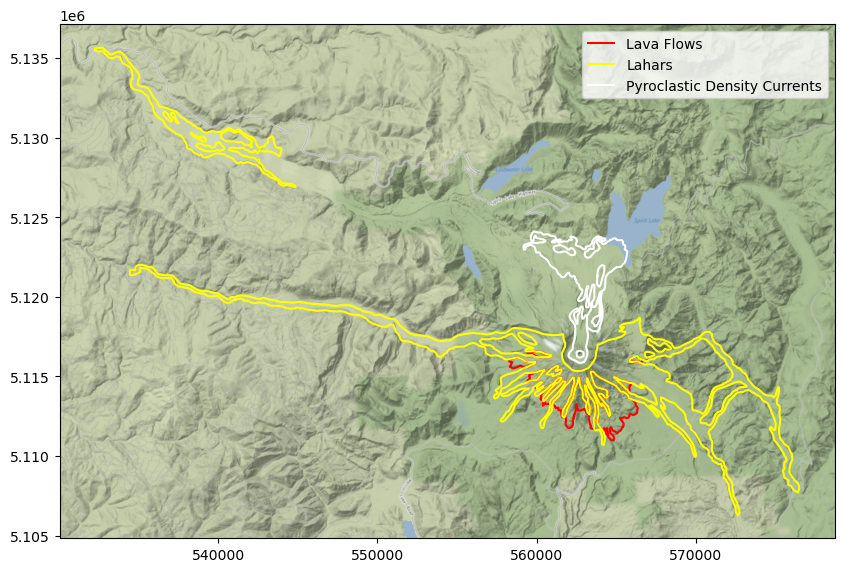

In [7]:
f,ax=plt.subplots(figsize=(10,10))
lava_flows.geometry.boundary.plot(ax=ax,color='red',label='Lava Flows')
lahars.geometry.boundary.plot(ax=ax,color='yellow',label='Lahars')
pyroclastic.geometry.boundary.plot(ax=ax,color='white',label='Pyroclastic Density Currents')
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax.legend()

## Sentinel-1 Overpass Times Context

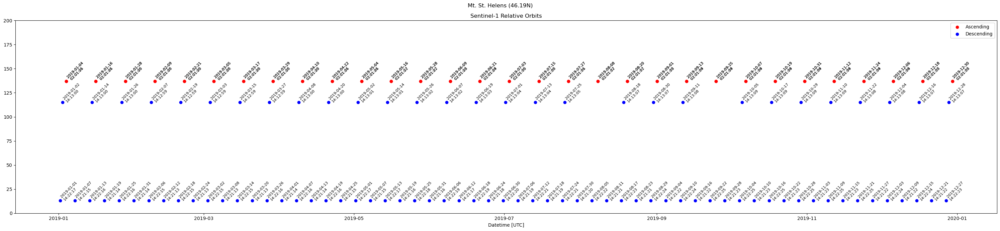

In [8]:
f,ax=plt.subplots(figsize=(30,7))
    
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

f.suptitle(f'{name}')
plt.tight_layout()

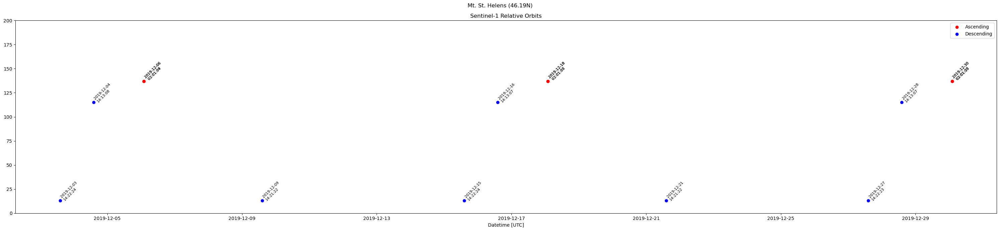

In [9]:
f,ax=plt.subplots(figsize=(30,7))

s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds.sel(time=slice('2019-12-01','2020-01-01')),ax=ax)

f.suptitle(f'{name}')
plt.tight_layout()

# Mask out treecover

In [10]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]

In [11]:
worldcover = s1_rtc_bs_utils.get_worldcover(ts_ds)
ts_ds = ts_ds.where(worldcover.isin(classes))

## Convert to dB

In [12]:
ts_ds_db = 10.0*np.log10(ts_ds)

# Now let's find the summertime average backscatter for each orbit and polarization

In [13]:
summer = slice('2019-06-01','2019-09-01')

In [14]:
summer_db = ts_ds_db.sel(time=summer).groupby('sat:relative_orbit').mean()

In [15]:
summer_db

<xarray.DataArray 'stackstac-44c714b51cc59986ee72bd25eff0d99f' (
                                                                sat:relative_orbit: 3,
                                                                band: 2,
                                                                y: 591, x: 709)>
dask.array<transpose, shape=(3, 2, 591, 709), dtype=float32, chunksize=(1, 1, 511, 511), chunktype=numpy.ndarray>
Coordinates: (12/30)
    sar:resolution_range         int64 20
    sar:resolution_azimuth       int64 22
    constellation                <U10 'Sentinel-1'
    sar:looks_azimuth            int64 1
    sar:looks_range              int64 5
    sar:looks_equivalent_number  float64 4.4
    ...                           ...
    esa_worldcover:product_tile  <U7 'N45W123'
    spatial_ref                  int64 0
  * band                         (band) <U2 'vh' 'vv'
  * x                            (x) float64 5.563e+05 5.563e+05 ... 5.705e+05
  * y                            (y) float64 5.122e+06 5.122e+06 ... 5.11e+06
  * sat:relative_orbit           (sat:relative_orbit) int64 13 115 137

# Now let's subtract these summer averages from the time series to get ratio images for all polarizations and orbits

In [33]:
ratio_images = ts_ds_db.groupby('sat:relative_orbit')-summer_db

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/core/indexing.py:1374: PerformanceWarning: Slicing with an out-of-order index is generating 31 times more chunks
  return self.array[key]


In [34]:
ratio_images

,Array,Chunk
Bytes,485.92 MiB,1.00 MiB
Shape,"(152, 2, 591, 709)","(1, 1, 511, 511)"
Count,36 Graph Layers,1216 Chunks
Type,float32,numpy.ndarray


# Let's view a time series of the VV and VH ratio images for the month of December

In [35]:
december = slice('2019-12-01','2019-12-31')

In [36]:
ratio_images_december = ratio_images.sel(time=december).compute()

/srv/conda/envs/notebook/lib/python3.10/site-packages/flox/aggregations.py:258: RuntimeWarning: invalid value encountered in true_divide
  finalize=lambda sum_, count: sum_ / count,


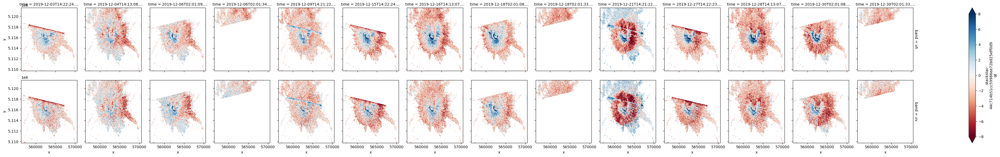

In [37]:
ratio_images_december.plot(row='band',col='time',vmin=-8,vmax=8,cmap='RdBu')

# Let's create binary snow maps for December 15th and 16th using a -2dB threshold

In [38]:
dec1516 = slice('2019-12-15','2019-12-16')

In [39]:
ratio_images_december1516 = ratio_images.sel(time=dec1516)

In [49]:
binary_wet_snow = xr.where(ratio_images_december1516>2,1,np.nan)

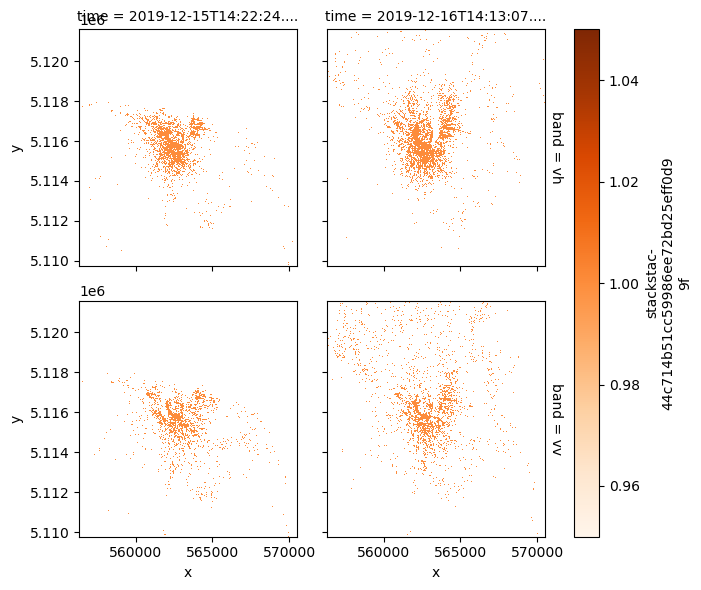

In [51]:
binary_wet_snow.plot(row='band',col='time',cmap='Oranges')

# Now we can combine the ratio images from the VV and VH polarizations using the method from Nagler et al. 2016 making use of local incidence angle. See https://www.mdpi.com/2072-4292/8/4/348

In [ ]:
# now how to bring in incidence angle rasters, one for each relative orbit...